In [24]:
from __future__ import print_function, unicode_literals, absolute_import, division
import sys
import numpy as np
import matplotlib
matplotlib.rcParams["image.interpolation"] = 'none'
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from glob import glob
from tqdm import tqdm
from tifffile import imread
from csbdeep.utils import Path, normalize

from stardist import fill_label_holes, random_label_cmap, calculate_extents, gputools_available
from stardist.matching import matching, matching_dataset
from stardist.models import Config2D, StarDist2D, StarDistData2D

import collections
collections.Callable = collections.abc.Callable

np.random.seed(42)
lbl_cmap = random_label_cmap()

In [78]:
X = sorted(glob('../../StarDist_Sami/images/*.tif'))
Y = sorted(glob('../../StarDist_Sami/masks/*.tif'))
assert all(Path(x).name==Path(y).name for x,y in zip(X,Y))

In [79]:
X = list(map(imread,X))
Y = list(map(imread,Y))
n_channel = 1 if X[0].ndim == 2 else X[0].shape[-1]

In [80]:
axis_norm = (0,1)   # normalize channels independently
# axis_norm = (0,1,2) # normalize channels jointly
if n_channel > 1:
    print("Normalizing image channels %s." % ('jointly' if axis_norm is None or 2 in axis_norm else 'independently'))
    sys.stdout.flush()

X = [normalize(x,1,99.8,axis=axis_norm) for x in tqdm(X)]
Y = [fill_label_holes(y) for y in tqdm(Y)]

100%|████████████████████████████████████████████| 10/10 [00:01<00:00,  6.97it/s]


In [81]:
assert len(X) > 1, "not enough training data"
rng = np.random.RandomState(42)
ind = rng.permutation(len(X))
n_val = max(1, int(round(0.15 * len(ind))))
ind_train, ind_val = ind[:-n_val], ind[-n_val:]
X_val, Y_val = [X[i] for i in ind_val]  , [Y[i] for i in ind_val]
X_trn, Y_trn = [X[i] for i in ind_train], [Y[i] for i in ind_train] 
print('number of images: %3d' % len(X))
print('- training:       %3d' % len(X_trn))
print('- validation:     %3d' % len(X_val))

number of images:  10
- training:         8
- validation:       2


In [82]:
def plot_img_label(img, lbl, img_title="image", lbl_title="label", **kwargs):
    fig, (ai,al) = plt.subplots(1,2, figsize=(12,5), gridspec_kw=dict(width_ratios=(1.25,1)))
    im = ai.imshow(img, cmap='gray', clim=(0,1))
    ai.set_title(img_title)    
    fig.colorbar(im, ax=ai)
    al.imshow(lbl, cmap=lbl_cmap)
    al.set_title(lbl_title)
    plt.tight_layout()

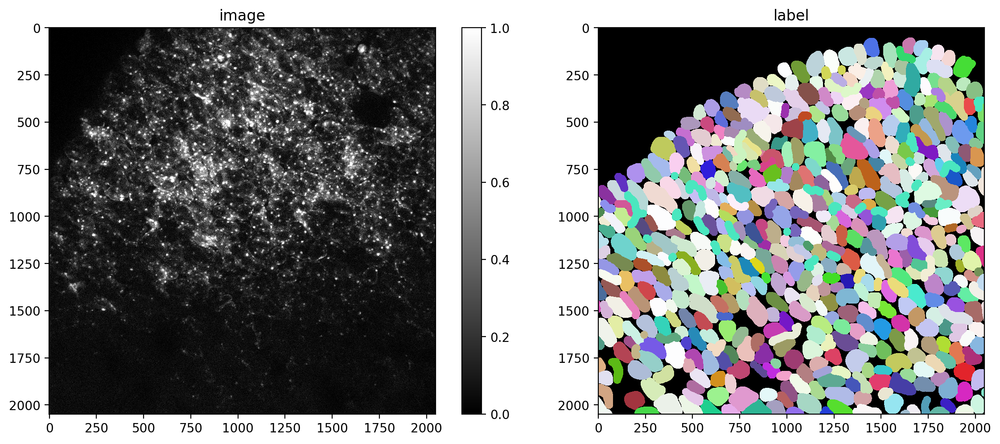

In [83]:
i = min(9, len(X)-1)
img, lbl = X[i], Y[i]
assert img.ndim in (2,3)
img = img if (img.ndim==2 or img.shape[-1]==3) else img[...,0]
plot_img_label(img,lbl)
None;

In [84]:
print(Config2D.__doc__)

Configuration for a :class:`StarDist2D` model.

    Parameters
    ----------
    axes : str or None
        Axes of the input images.
    n_rays : int
        Number of radial directions for the star-convex polygon.
        Recommended to use a power of 2 (default: 32).
    n_channel_in : int
        Number of channels of given input image (default: 1).
    grid : (int,int)
        Subsampling factors (must be powers of 2) for each of the axes.
        Model will predict on a subsampled grid for increased efficiency and larger field of view.
    n_classes : None or int
        Number of object classes to use for multi-class predection (use None to disable)
    backbone : str
        Name of the neural network architecture to be used as backbone.
    kwargs : dict
        Overwrite (or add) configuration attributes (see below).


    Attributes
    ----------
    unet_n_depth : int
        Number of U-Net resolution levels (down/up-sampling layers).
    unet_kernel_size : (int,int)
   

In [85]:
# 32 is a good default choice (see 1_data.ipynb)
n_rays = 32

# Use OpenCL-based computations for data generator during training (requires 'gputools')
use_gpu = True #and gputools_available()


# ARTO: The warning about field of view can be solved by increasing the grid size below! The reported
# median object size is very close to the limits of current FoV, so changing (2,2) to (4,4) should be enough.
# This doubles the limits of the FoV.

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (4,4)  # ARTO: changed from (2,2)

conf = Config2D (
    n_rays       = n_rays,
    grid         = grid,
    use_gpu      = use_gpu,
    n_channel_in = n_channel,
    
    # ARTO: you could also increase 'train_patch_size' from (256, 256) to include more local context.
    # The patch size must be smaller than the smallest image in the training set!!!
    # Ensure patch size is divisible by 16!
    train_patch_size = (320, 320)
)
print(conf)
vars(conf)

Config2D(n_dim=2, axes='YXC', n_channel_in=1, n_channel_out=33, train_checkpoint='weights_best.h5', train_checkpoint_last='weights_last.h5', train_checkpoint_epoch='weights_now.h5', n_rays=32, grid=(4, 4), backbone='unet', n_classes=None, unet_n_depth=3, unet_kernel_size=(3, 3), unet_n_filter_base=32, unet_n_conv_per_depth=2, unet_pool=(2, 2), unet_activation='relu', unet_last_activation='relu', unet_batch_norm=False, unet_dropout=0.0, unet_prefix='', net_conv_after_unet=128, net_input_shape=(None, None, 1), net_mask_shape=(None, None, 1), train_shape_completion=False, train_completion_crop=32, train_patch_size=(320, 320), train_background_reg=0.0001, train_foreground_only=0.9, train_sample_cache=True, train_dist_loss='mae', train_loss_weights=(1, 0.2), train_class_weights=(1, 1), train_epochs=400, train_steps_per_epoch=100, train_learning_rate=0.0003, train_batch_size=4, train_n_val_patches=None, train_tensorboard=True, train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, 

{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 1,
 'n_channel_out': 33,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_rays': 32,
 'grid': (4, 4),
 'backbone': 'unet',
 'n_classes': None,
 'unet_n_depth': 3,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 1),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (320, 320),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_sample_cache': True,
 'train_dist_loss': 'mae',
 'train_loss_weights': (1, 0.2),
 'train_class_weights': (1, 1),
 'train_epochs': 400,
 'train_steps_per_epoch': 100,
 'train_learning_rate': 0.0003,


In [86]:
#if use_gpu:
#    from csbdeep.utils.tf import limit_gpu_memory
    # adjust as necessary: limit GPU memory to be used by TensorFlow to leave some to OpenCL-based computations
#    limit_gpu_memory(0.8)
    # alternatively, try this:
    # limit_gpu_memory(None, allow_growth=True)

In [87]:
# ARTO: Here you can input the exact model. Place all created models (folders) to the folder given to 'basedir'.
# The argument to 'name' defines which folder within 'basedir' contains the wanted model.
model = StarDist2D(conf, name='stardist_silvana_051223', basedir='models')

Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.66155, nms_thresh=0.4.


base_model.py (149): output path for model already exists, files may be overwritten: /Users/kilpinen/Workspace/Stardist_runs/Silvana/code/models/stardist_silvana_051223


In [88]:
median_size = calculate_extents(list(Y), np.median)
fov = np.array(model._axes_tile_overlap('YX'))
print(f"median object size:      {median_size}")
print(f"network field of view :  {fov}")
if any(median_size > fov):
    print("WARNING: median object size larger than field of view of the neural network.")

median object size:      [ 94.5 100. ]
network field of view :  [184 185]


In [89]:
def random_fliprot(img, mask): 
    assert img.ndim >= mask.ndim
    axes = tuple(range(mask.ndim))
    perm = tuple(np.random.permutation(axes))
    img = img.transpose(perm + tuple(range(mask.ndim, img.ndim))) 
    mask = mask.transpose(perm) 
    for ax in axes: 
        if np.random.rand() > 0.5:
            img = np.flip(img, axis=ax)
            mask = np.flip(mask, axis=ax)
    return img, mask 

def random_intensity_change(img):
    img = img*np.random.uniform(0.6,2) + np.random.uniform(-0.2,0.2)
    return img


def augmenter(x, y):
    """Augmentation of a single input/label image pair.
    x is an input image
    y is the corresponding ground-truth label image
    """
    x, y = random_fliprot(x, y)
    x = random_intensity_change(x)
    # add some gaussian noise
    sig = 0.02*np.random.uniform(0,1)
    x = x + sig*np.random.normal(0,1,x.shape)
    return x, y

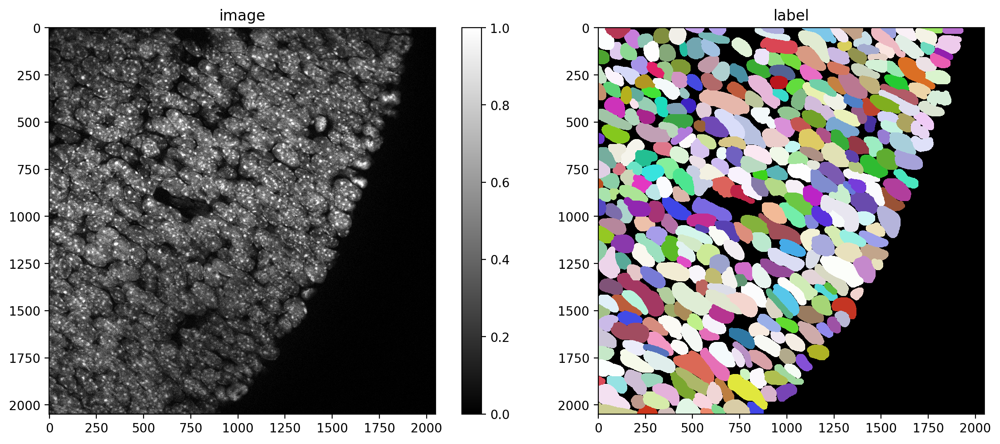

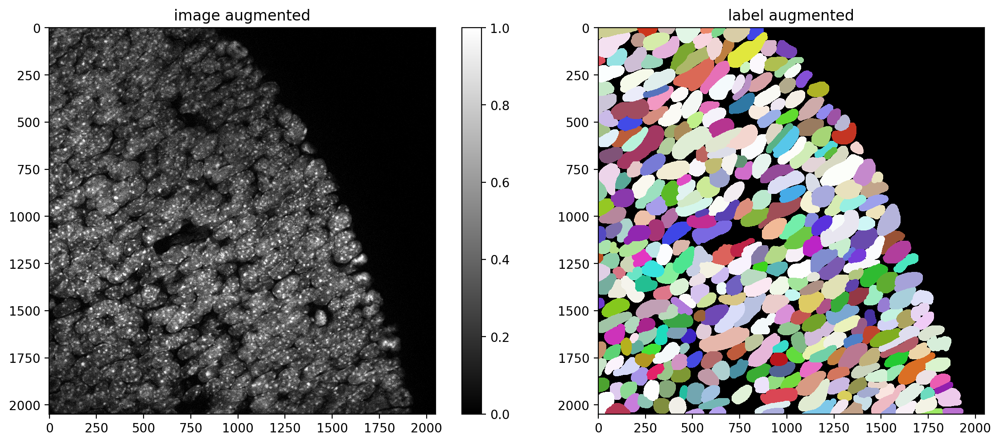

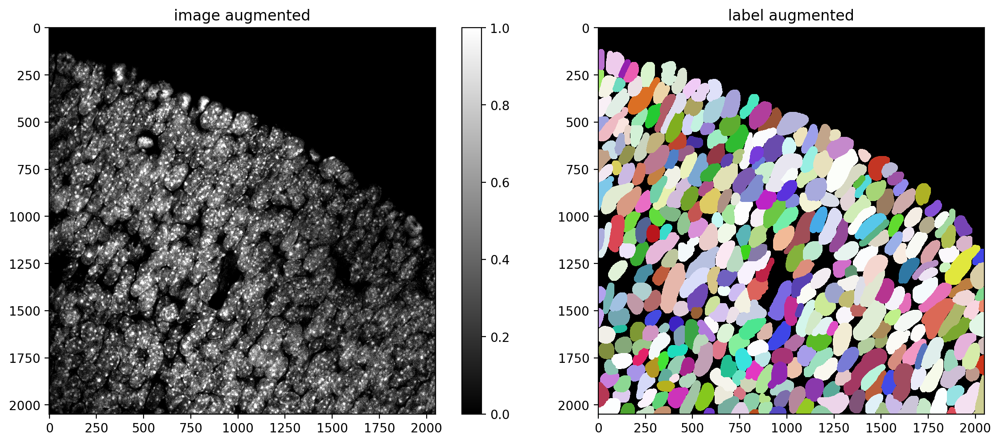

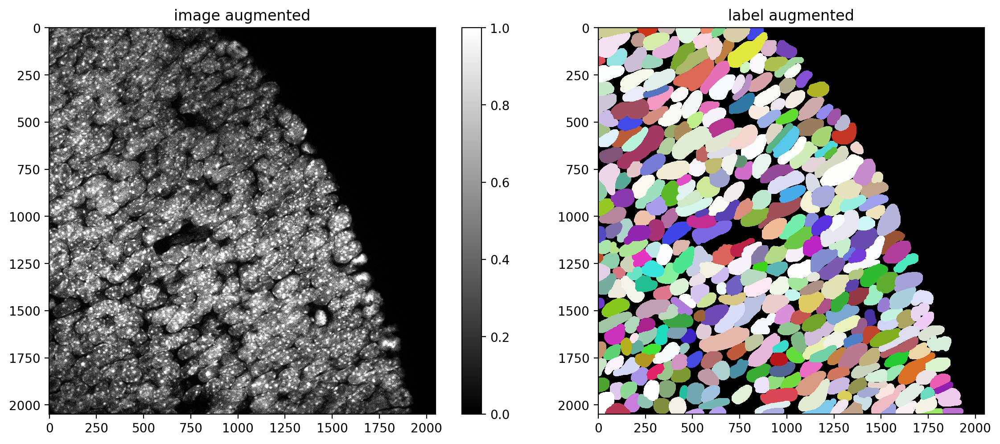

In [90]:
# plot some augmented examples
img, lbl = X[0],Y[0]
plot_img_label(img, lbl)
for _ in range(3):
    img_aug, lbl_aug = augmenter(img,lbl)
    plot_img_label(img_aug, lbl_aug, img_title="image augmented", lbl_title="label augmented")

In [91]:
quick_demo = False

if quick_demo:
    print (
        "NOTE: This is only for a quick demonstration!\n"
        "      Please set the variable 'quick_demo = False' for proper (long) training.",
        file=sys.stderr, flush=True
    )
    model.train(X_trn, Y_trn, validation_data=(X_val,Y_val), augmenter=augmenter,
                epochs=2, steps_per_epoch=10)

    print("====> Stopping training and loading previously trained demo model from disk.", file=sys.stderr, flush=True)
    model = StarDist2D.from_pretrained('2D_demo')
else:
    model.train(X_trn, Y_trn, validation_data=(X_val,Y_val), augmenter=augmenter)
None;

Epoch 1/400


2023-12-07 12:03:02.875242: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node Adam/AssignAddVariableOp.


100/100 [==============================] - 7s 53ms/step - loss: 6.8455 - prob_loss: 0.6750 - dist_loss: 30.8524 - prob_kld: 0.2670 - dist_relevant_mae: 30.8518 - dist_relevant_mse: 1535.8073 - dist_dist_iou_metric: 0.0922 - val_loss: 4.1142 - val_prob_loss: 0.6536 - val_dist_loss: 17.3031 - val_prob_kld: 0.2094 - val_dist_relevant_mae: 17.3012 - val_dist_relevant_mse: 564.7703 - val_dist_dist_iou_metric: 0.3301 - lr: 3.0000e-04
Epoch 2/400
100/100 [==============================] - 4s 38ms/step - loss: 4.2394 - prob_loss: 0.6441 - dist_loss: 17.9761 - prob_kld: 0.2372 - dist_relevant_mae: 17.9739 - dist_relevant_mse: 619.5309 - dist_dist_iou_metric: 0.3452 - val_loss: 4.1570 - val_prob_loss: 0.7285 - val_dist_loss: 17.1427 - val_prob_kld: 0.2842 - val_dist_relevant_mae: 17.1403 - val_dist_relevant_mse: 500.3851 - val_dist_dist_iou_metric: 0.3961 - lr: 3.0000e-04
Epoch 3/400
100/100 [==============================] - 4s 38ms/step - loss: 4.0013 - prob_loss: 0.6266 - dist_loss: 16.8735 -

100/100 [==============================] - 219s 2s/step - loss: 1.7505 - prob_loss: 0.4470 - dist_loss: 6.5176 - prob_kld: 0.0667 - dist_relevant_mae: 6.5157 - dist_relevant_mse: 147.2559 - dist_dist_iou_metric: 0.7080 - val_loss: 1.6796 - val_prob_loss: 0.4735 - val_dist_loss: 6.0306 - val_prob_kld: 0.0723 - val_dist_relevant_mae: 6.0286 - val_dist_relevant_mse: 121.8761 - val_dist_dist_iou_metric: 0.7159
Epoch 382/400
100/100 [==============================] - 218s 2s/step - loss: 1.7716 - prob_loss: 0.4443 - dist_loss: 6.6364 - prob_kld: 0.0686 - dist_relevant_mae: 6.6345 - dist_relevant_mse: 148.4820 - dist_dist_iou_metric: 0.7017 - val_loss: 1.6725 - val_prob_loss: 0.4733 - val_dist_loss: 5.9959 - val_prob_kld: 0.0720 - val_dist_relevant_mae: 5.9940 - val_dist_relevant_mse: 121.4478 - val_dist_dist_iou_metric: 0.7174
Epoch 383/400
100/100 [==============================] - 217s 2s/step - loss: 1.7498 - prob_loss: 0.4276 - dist_loss: 6.6113 - prob_kld: 0.0652 - dist_relevant_mae: 6

In [92]:
if quick_demo:
    model.optimize_thresholds(X_val[:2], Y_val[:2])
else:
    model.optimize_thresholds(X_val, Y_val)

NMS threshold = 0.5:  75%|█████▎ | 15/20 [00:20<00:06,  1.34s/it, 0.600 -> 0.503]


Using optimized values: prob_thresh=0.572919, nms_thresh=0.3.
Saving to 'thresholds.json'.


In [93]:
Y_val_pred = [model.predict_instances(x, n_tiles=model._guess_n_tiles(x), show_tile_progress=False)[0]
              for x in tqdm(X_val)]

100%|██████████████████████████████████████████████| 2/2 [00:03<00:00,  1.61s/it]


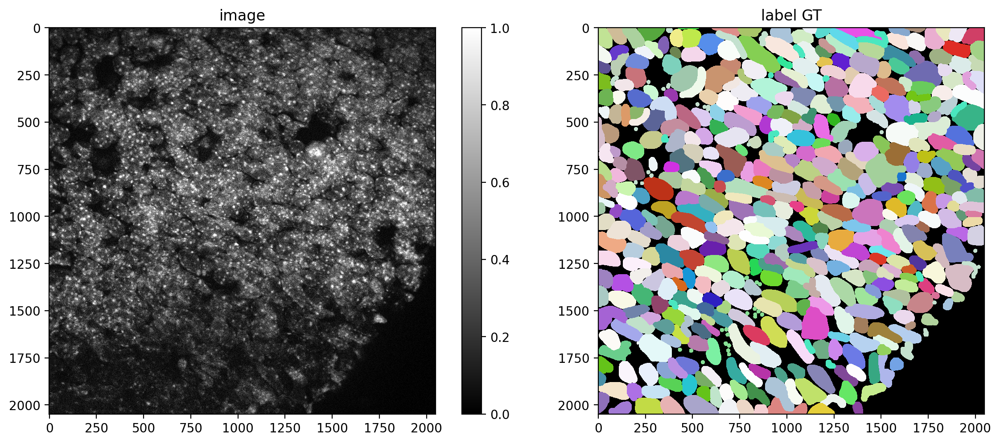

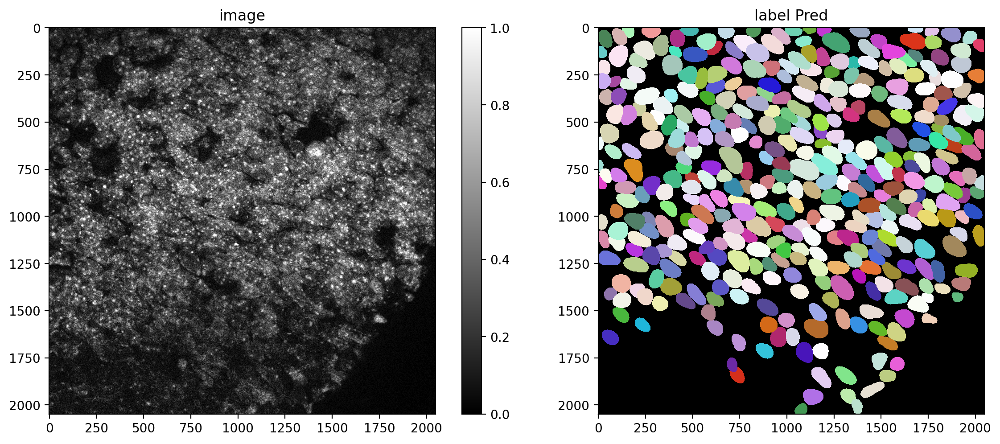

In [94]:
plot_img_label(X_val[0],Y_val[0], lbl_title="label GT")
plot_img_label(X_val[0],Y_val_pred[0], lbl_title="label Pred")

In [95]:

# ARTO: The optimized thresholds are stored in config.json within the model folder. If the segmentation
# either merges cells or splits a cell to multiple, you can edit the non-maximum suppression threshold
# in the json.


In [96]:
taus = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
stats = [matching_dataset(Y_val, Y_val_pred, thresh=t, show_progress=False) for t in tqdm(taus)]

100%|██████████████████████████████████████████████| 9/9 [00:01<00:00,  4.83it/s]


In [97]:
stats[taus.index(0.5)]

DatasetMatching(criterion='iou', thresh=0.5, fp=249, tp=654, fn=359, precision=0.7242524916943521, recall=0.6456071076011846, accuracy=0.5182250396196514, f1=0.6826722338204593, n_true=1013, n_pred=903, mean_true_score=0.47375976321492475, mean_matched_score=0.7338205506677656, panoptic_quality=0.5009589145477231, by_image=False)

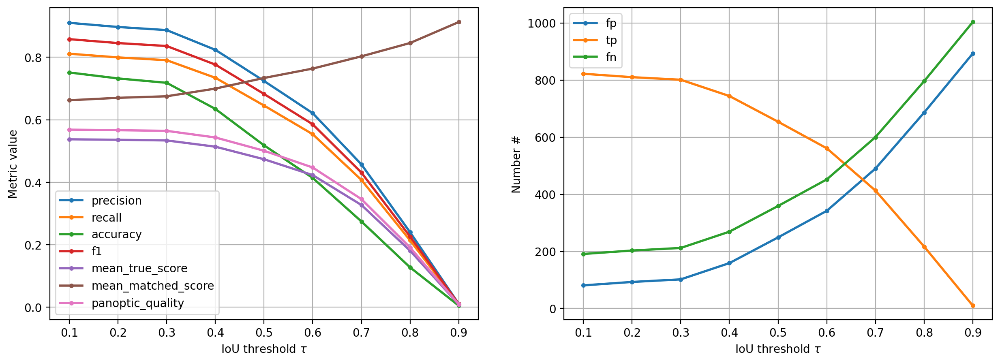

In [98]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15,5))

for m in ('precision', 'recall', 'accuracy', 'f1', 'mean_true_score', 'mean_matched_score', 'panoptic_quality'):
    ax1.plot(taus, [s._asdict()[m] for s in stats], '.-', lw=2, label=m)
ax1.set_xlabel(r'IoU threshold $\tau$')
ax1.set_ylabel('Metric value')
ax1.grid()
ax1.legend()

for m in ('fp', 'tp', 'fn'):
    ax2.plot(taus, [s._asdict()[m] for s in stats], '.-', lw=2, label=m)
ax2.set_xlabel(r'IoU threshold $\tau$')
ax2.set_ylabel('Number #')
ax2.grid()
ax2.legend();